# ArtificallyAddingNoise in Images 

This work is part of the experimental analysis for the paper Low Latency Video Denoising for Video Conferencing Using CNN Architectures 

Authors of this notebook, Masters Computer Science students, Seattle University Fall, 2022
 - Altanai Bisht
 - Ana Carolina Mendes
 - Justin Thoreson
Faculty Advisor 
- Dr Shadrokh Samavi

This work is under MIT License.

----------------------------------------

**Contents of this Notebook**

* Artifically AddingNoise in Images
   * Ground Truth loading in train df
   * Inducing gauss noise
   * Inducing Salt and Pepper noise
   * load noisy train dataset
* Frame Extraction from Video
* Segmenting I P and B frames from Video

--------------------------------------------------------

In [ ]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import os
from google.colab.patches import cv2_imshow
import tensorflow as tf

In [ ]:
# dirpath = "/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/train"
dirpath = "/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain"
noisyddirpath="/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy"
dirgaussnoisypath="/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy_gauss"

## Ground Truth loading in train df 

In [ ]:
## resize the screenhots 

train_images = sorted(os.listdir(dirpath))
imgsize=(240,320,3)
newsize=(320,240)
train_image = []
for im in train_images[1:10]:
    print(im)
    img = tf.keras.utils.load_img(dirpath +"/"+ im)
    # img = img.resize(newsize)
    img = tf.keras.utils.img_to_array(img)
    img = img/255
    train_image.append(img)

train_df = np.array(train_image)
train_df.shape

Screenshot (100).png
Screenshot (101).png
Screenshot (102).png
Screenshot (11).png
Screenshot (12).png
Screenshot (13).png
Screenshot (14).png
Screenshot (15).png
Screenshot (16).png


(9, 1080, 1920, 3)

## Inducing gauss noise 

In [ ]:
noise_type="gauss"

noise_level=0.3
def add_noise(image):
    row,col,ch= image.shape
    mean = 0
    sigma = 1
    gauss = np.random.normal(mean,sigma,(row,col,ch))
    gauss = gauss.reshape(row,col,ch)
    noisy = image + gauss*noise_level
    return noisy

noised_df= []
i=0
for im in train_images[1:10]:
    img = tf.keras.utils.load_img(dirpath +"/"+ im)
    # img = img.resize(newsize)
    img = tf.keras.utils.img_to_array(img)
    img = img/255
    noisy_img= add_noise(img)
    noised_df.append(noisy_img)
    path=dirgaussnoisypath+"/"+im
    print(path)
    cv2.imwrite(path, noisy_img)
    i=i+1
    
noised_df= np.array(noised_df)
noised_df.shape

/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy_gauss/Screenshot (100).png
/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy_gauss/Screenshot (101).png
/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy_gauss/Screenshot (102).png
/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy_gauss/Screenshot (11).png
/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy_gauss/Screenshot (12).png
/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy_gauss/Screenshot (13).png
/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy_gauss/Screenshot (14).png
/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy_gauss/Screenshot (15).png
/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy_gauss/Screenshot (16).png


(9, 1080, 1920, 3)

## Inducing Salt and Pepper noise 

In [ ]:
from skimage.util import random_noise
noise_level=0.3
noise_type= "SaltPepperNoise"
i=1
# for img in train_df:
#   # img=train_df[i]
for im in train_images[1:10]:
    img = tf.keras.utils.load_img(dirpath +"/"+ im)
    # img = img.resize(newsize)
    img = tf.keras.utils.img_to_array(img)
    img = img/255
    noise_img = random_noise(img, mode='s&p',amount=noise_level)  # salt-and-pepper noise to the image.
    sp_img = np.array(255*noise_img, dtype = 'uint8')
    # showNoiseEffect(img, None, noise_type, _img)
    # cv2_imshow(sp_img)
    # path=noisyddirpath+"/"+noise_type+"_gnimg_"+str(i)+".jpg"
    path=noisyddirpath+"/"+im
    print(path)
    cv2.imwrite(path, sp_img)
    i=i+1

/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy/Screenshot (100).png
/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy/Screenshot (101).png
/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy/Screenshot (102).png
/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy/Screenshot (11).png
/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy/Screenshot (12).png
/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy/Screenshot (13).png
/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy/Screenshot (14).png
/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy/Screenshot (15).png
/content/drive/MyDrive/RealtimeDenoising/WebRTCCapturesDataset/conftrain_noisy/Screenshot (16).png


## load noisy train dataset


In [18]:
## resize the screenhots 

noisytrain_images = sorted(os.listdir(noisyddirpath))
noisytrain_image = []
for im in noisytrain_images:
    img = tf.keras.utils.load_img(noisyddirpath +"/"+ im)
    # img = img.resize(newsize)
    img = tf.keras.utils.img_to_array(img)
    img = img/255
    noisytrain_image.append(img)

noisytrain_df = np.array(noisytrain_image)
noisytrain_df.shape

(9, 1080, 1920, 3)

In [19]:
def showNoiseEffect(img, noiseyimg, noisetype, gn_img):
  fig=plt.figure(dpi=300)

  fig.add_subplot(1,3,1)
  # plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.imshow(img)
  plt.axis("off")
  plt.title("Original",  fontsize = 8)

  if(noiseyimg is not None):
    fig.add_subplot(1,3,2)
    plt.imshow(noiseyimg)
    # plt.imshow(cv2.cvtColor(noiseyimg, cv2.COLOR_BGR2RGB))
    plt.imshow(noiseyimg)
    plt.axis("off")
    plt.title(noisetype,  fontsize = 8)

  fig.add_subplot(1,3,3)
  # plt.imshow(cv2.cvtColor(gn_img, cv2.COLOR_BGR2RGB))
  plt.imshow(gn_img)
  plt.axis("off")
  plt.title("Noisy Image \n"+ noisetype, fontsize = 8)

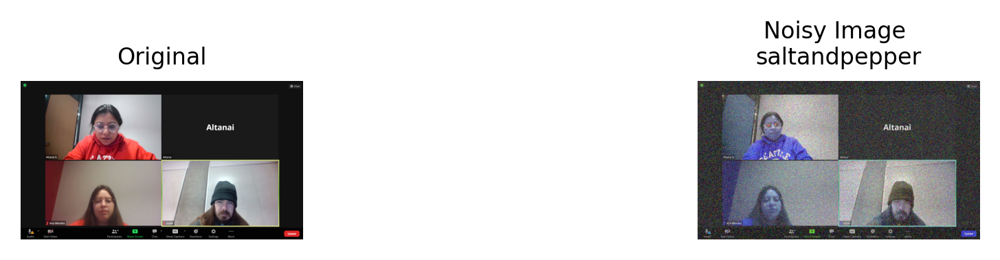

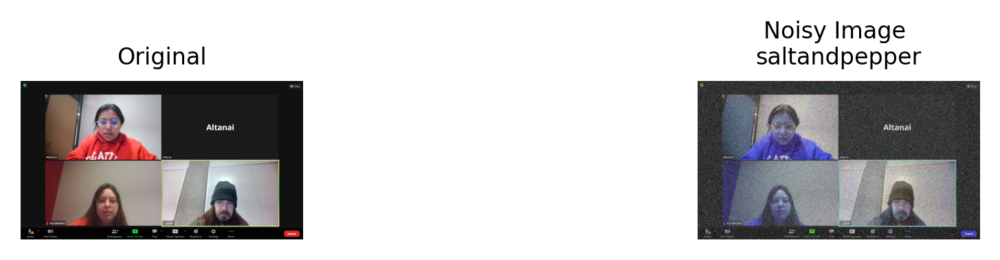

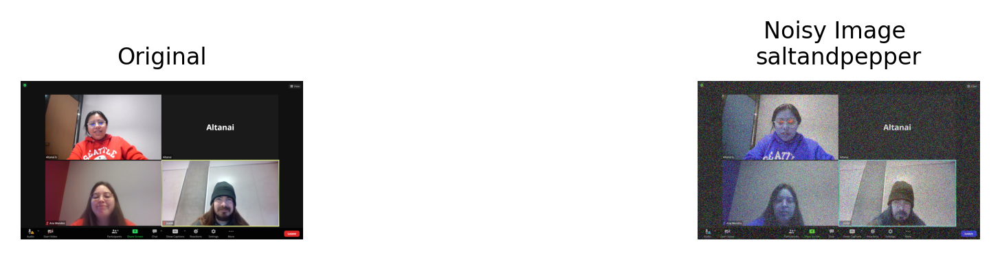

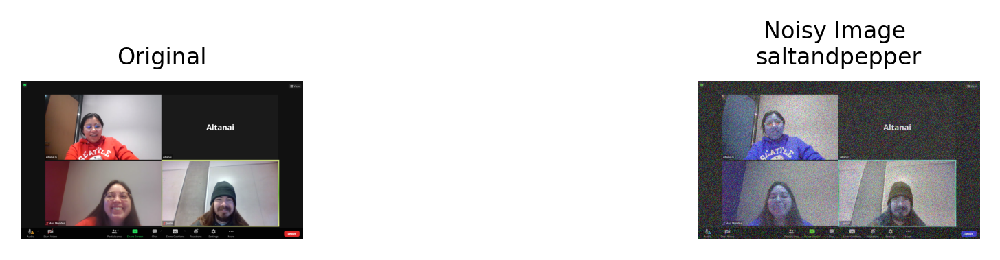

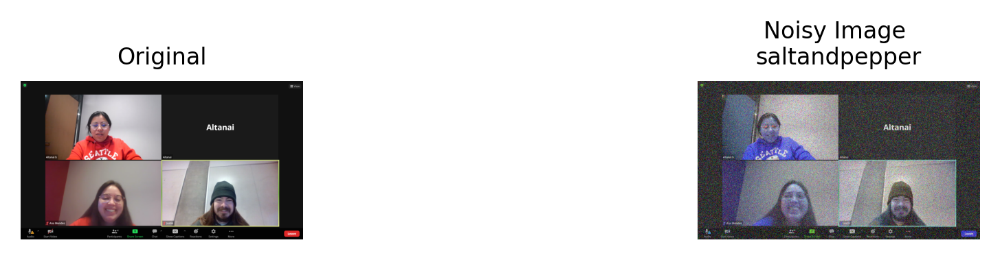

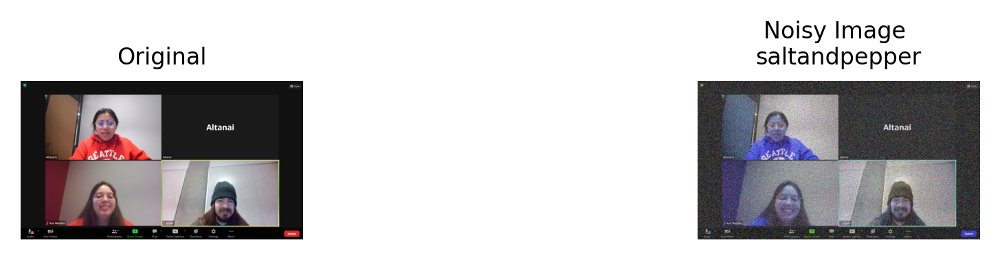

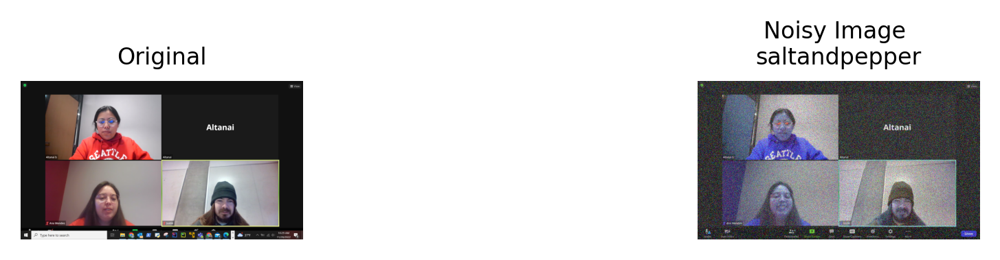

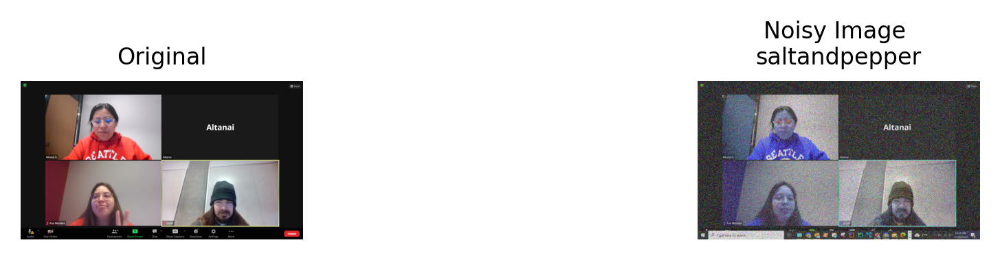

In [20]:
x=0
noise_type="saltandpepper"
for img in train_df[1:10]:
  showNoiseEffect(img, None, noise_type, noisytrain_df[x])
  x=x+1

In [ ]:
import cv2
from skimage.restoration import estimate_sigma

def estimate_noise(image_path):
    img = cv2.imread(image_path)
    return estimate_sigma(img, multichannel=True, average_sigmas=True)

print("Estimated Noise")
estimate_noise("/content/SaltPepperNoise_gnimg.jpg")

Estimated Noise


47.28200973320306

# Frame Extraction from Video 

AttributeError: ignored

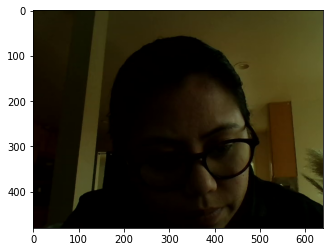

In [10]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from IPython.display import clear_output
%matplotlib inline

# video = several frames (images shown after each other)
video = cv2.VideoCapture('/content/record.mp4')

try:
    while video.isOpened():

        is_grabbed, frame = video.read()

        # because the end of the video
        if not is_grabbed:
            break

        #cv2.imshow('Lane Detection Video', frame)
        #cv2.waitKey(20)
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.imshow(frame)

        plt.show()
        # clear_output(wait=True)
                        
except KeyboardInterrupt:
    # Release the Video Device
    video.release()
    # Message to be displayed after releasing the device
    print("Released Video Resource")

# Segmenting I P and B frames from Video

In [14]:
import os
import cv2
import subprocess
from matplotlib import pyplot as plt

Saved: record_i_frame_1.jpg


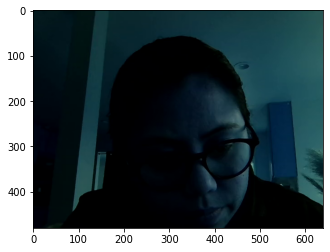

Saved: record_i_frame_2.jpg


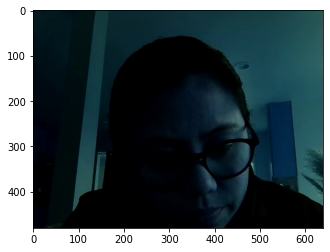

Saved: record_i_frame_3.jpg


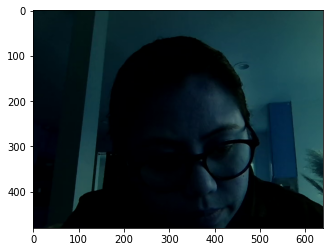

Saved: record_i_frame_5.jpg


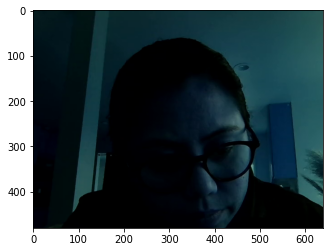

Saved: record_i_frame_6.jpg


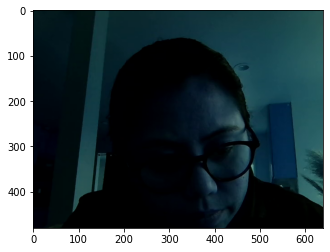

Saved: record_i_frame_7.jpg


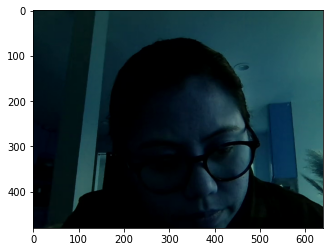

Saved: record_i_frame_9.jpg


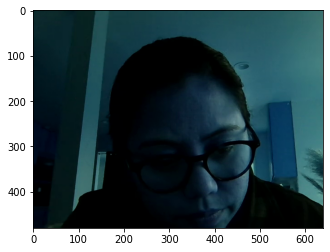

Saved: record_i_frame_11.jpg


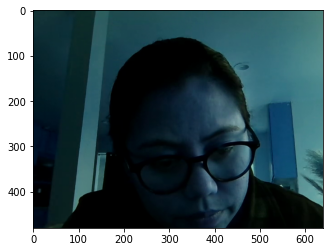

Saved: record_i_frame_12.jpg


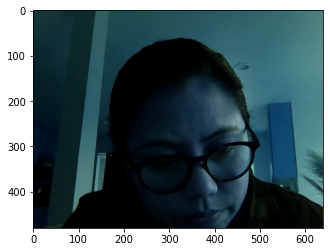

Saved: record_i_frame_13.jpg


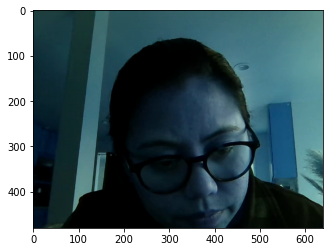

Saved: record_i_frame_15.jpg


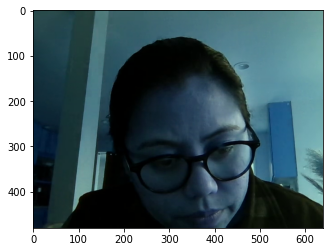

Saved: record_i_frame_16.jpg


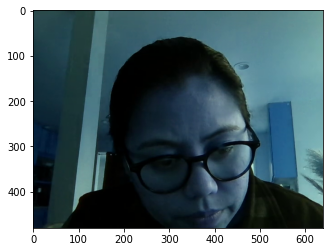

Saved: record_i_frame_17.jpg


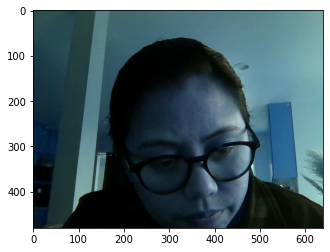

Saved: record_i_frame_19.jpg


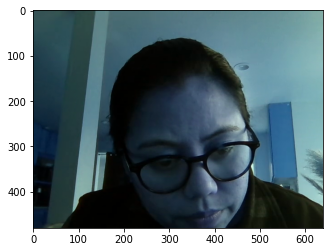

Saved: record_i_frame_20.jpg


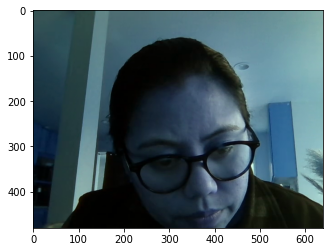

Saved: record_i_frame_21.jpg


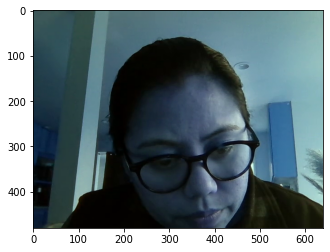

Saved: record_i_frame_23.jpg


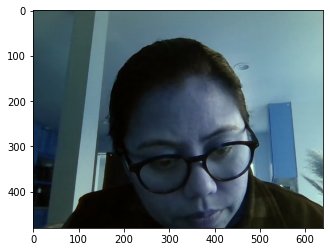

Saved: record_i_frame_24.jpg


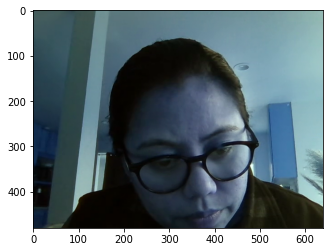

Saved: record_i_frame_25.jpg


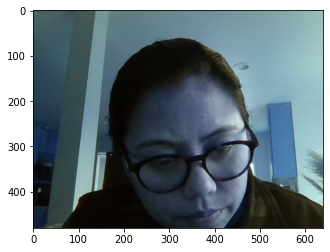

Saved: record_i_frame_27.jpg


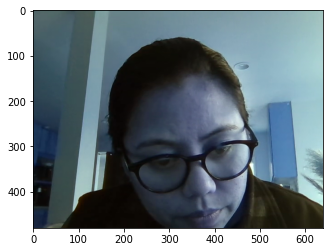

Saved: record_i_frame_28.jpg


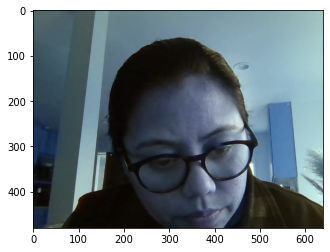

Saved: record_i_frame_29.jpg


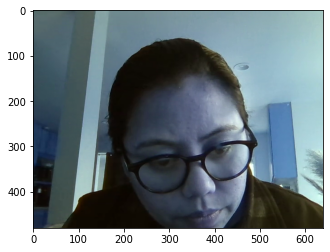

Saved: record_i_frame_31.jpg


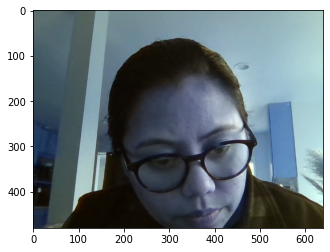

Saved: record_i_frame_32.jpg


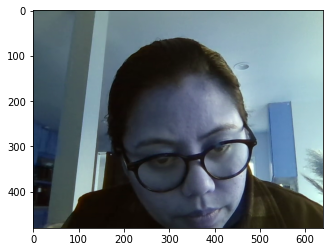

Saved: record_i_frame_33.jpg


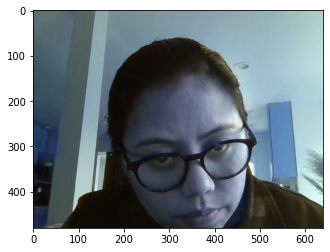

Saved: record_i_frame_35.jpg


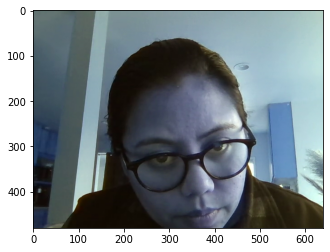

Saved: record_i_frame_36.jpg


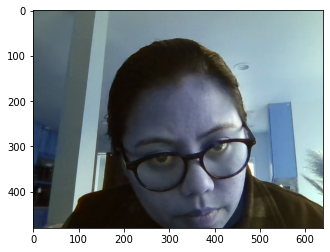

Saved: record_i_frame_37.jpg


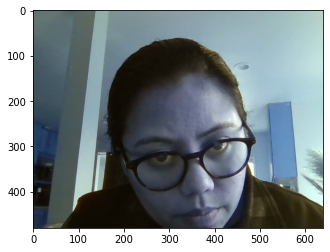

Saved: record_i_frame_39.jpg


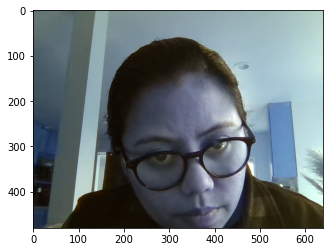

Saved: record_i_frame_40.jpg


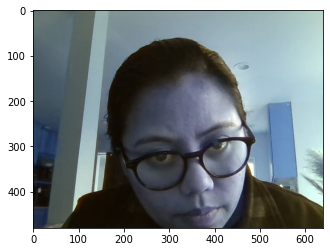

Saved: record_i_frame_41.jpg


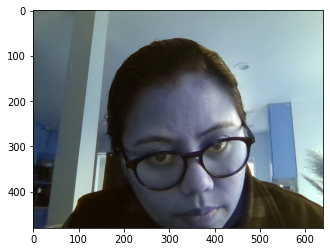

Saved: record_i_frame_43.jpg


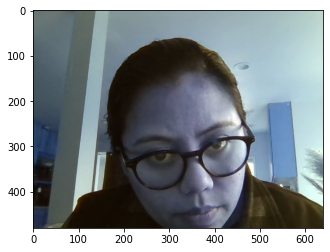

Saved: record_i_frame_44.jpg


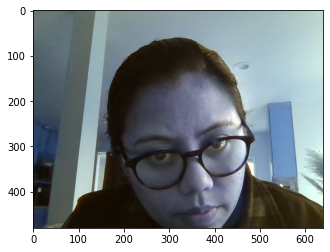

Saved: record_i_frame_45.jpg


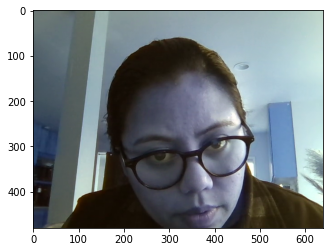

Saved: record_i_frame_47.jpg


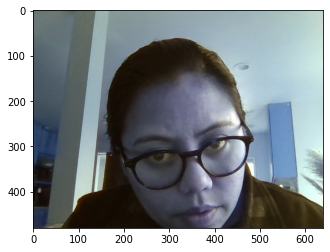

Saved: record_i_frame_48.jpg


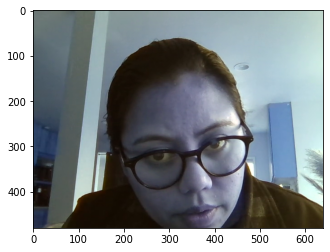

Saved: record_i_frame_49.jpg


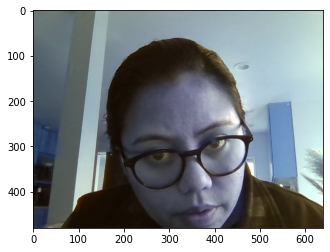

Saved: record_i_frame_51.jpg


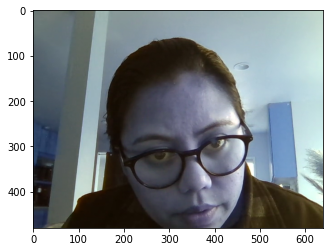

Saved: record_i_frame_52.jpg


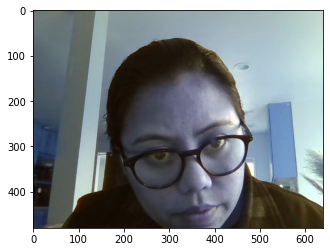

Saved: record_i_frame_53.jpg


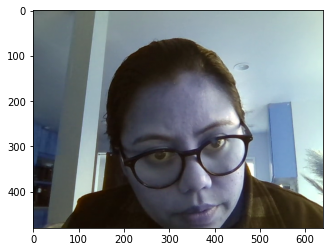

Saved: record_i_frame_55.jpg


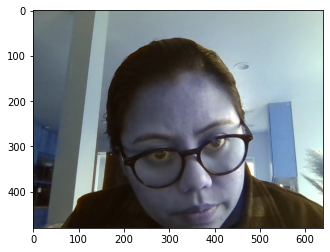

Saved: record_i_frame_56.jpg


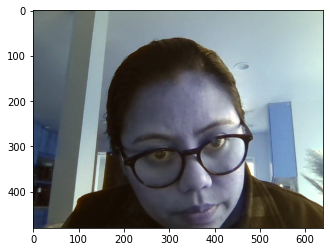

Saved: record_i_frame_57.jpg


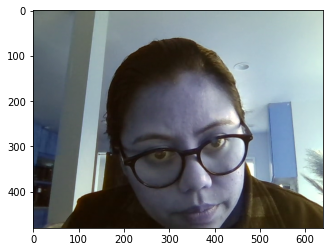

Saved: record_i_frame_59.jpg


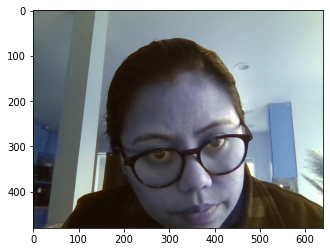

Saved: record_i_frame_60.jpg


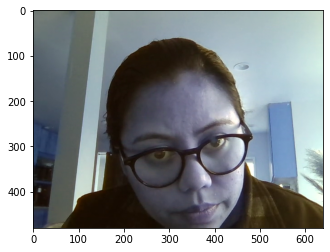

Saved: record_i_frame_61.jpg


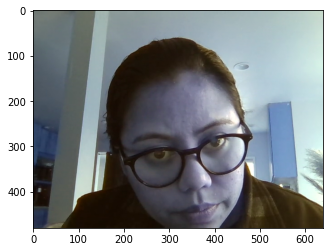

Saved: record_i_frame_63.jpg


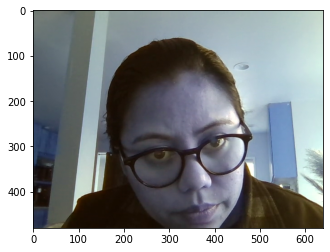

Saved: record_i_frame_64.jpg


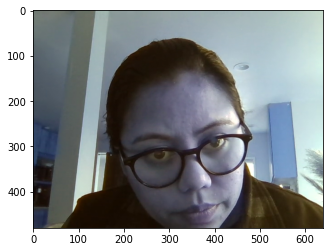

Saved: record_i_frame_65.jpg


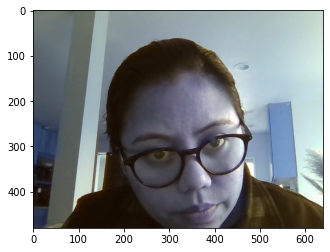

Saved: record_i_frame_67.jpg


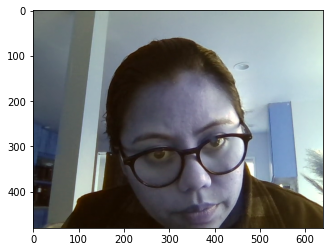

Saved: record_i_frame_68.jpg


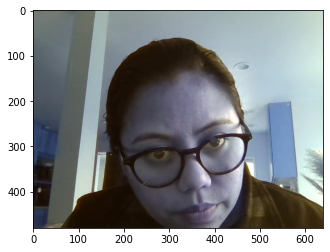

Saved: record_i_frame_69.jpg


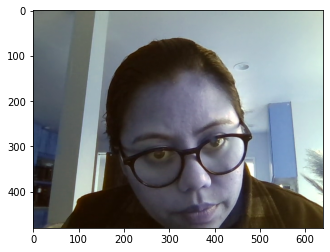

Saved: record_i_frame_71.jpg


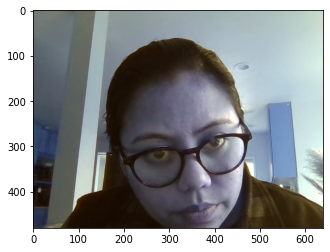

Saved: record_i_frame_72.jpg


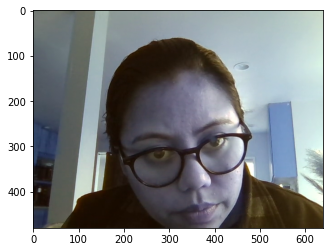

Saved: record_i_frame_73.jpg


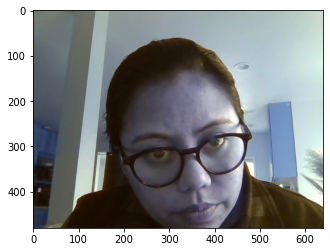

Saved: record_i_frame_75.jpg


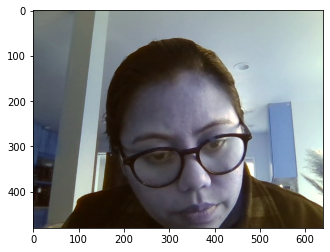

Saved: record_i_frame_76.jpg


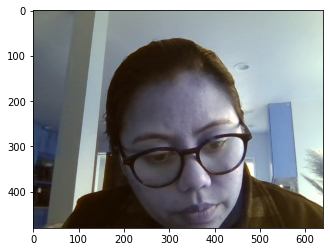

Saved: record_i_frame_77.jpg


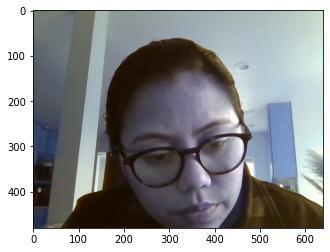

Saved: record_i_frame_79.jpg


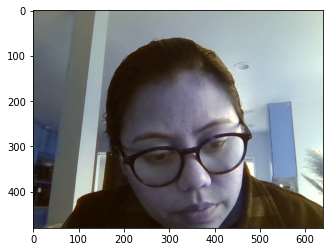

Saved: record_i_frame_80.jpg


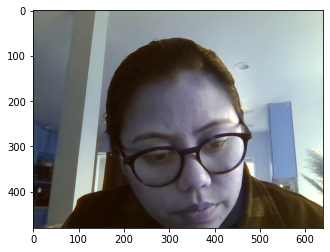

Saved: record_i_frame_81.jpg


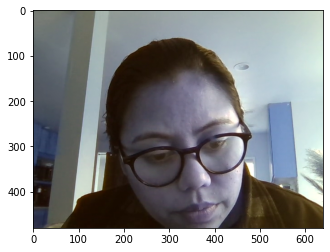

Saved: record_i_frame_83.jpg


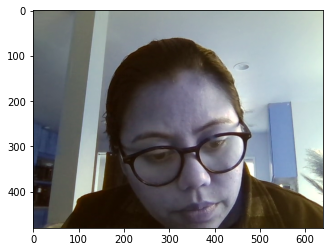

Saved: record_i_frame_84.jpg


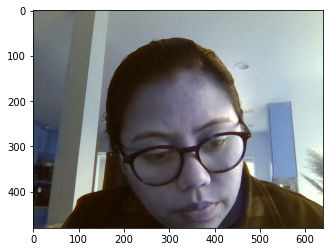

Saved: record_i_frame_85.jpg


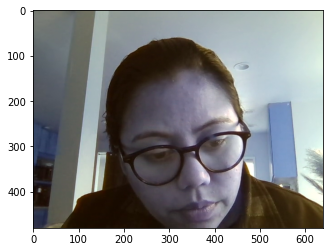

Saved: record_i_frame_87.jpg


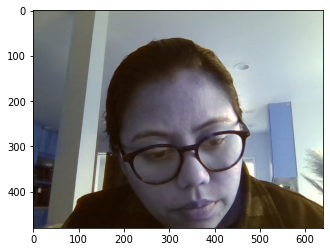

Saved: record_i_frame_88.jpg


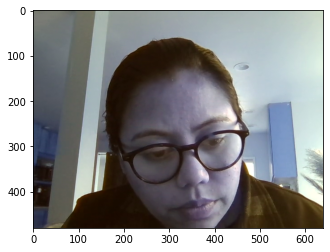

Saved: record_i_frame_89.jpg


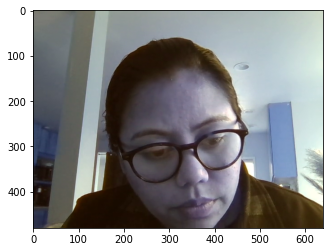

Saved: record_i_frame_91.jpg


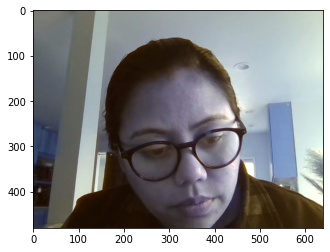

Saved: record_i_frame_92.jpg


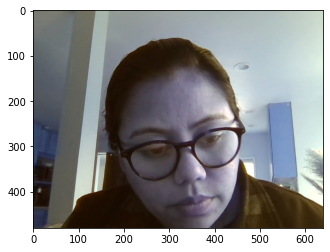

Saved: record_i_frame_93.jpg


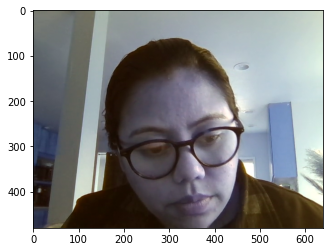

Saved: record_i_frame_95.jpg


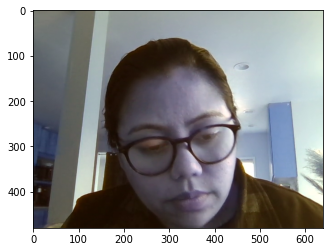

Saved: record_i_frame_96.jpg


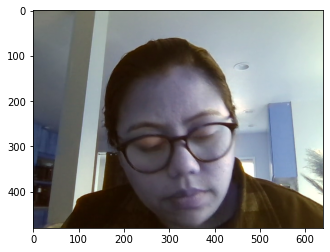

Saved: record_i_frame_97.jpg


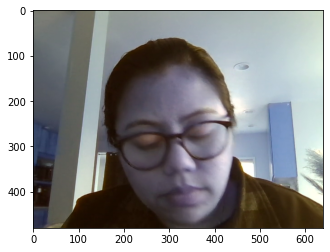

Saved: record_i_frame_99.jpg


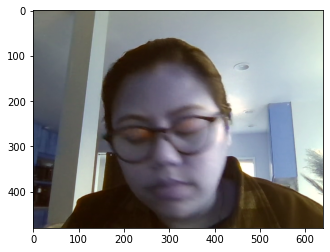

Saved: record_i_frame_100.jpg


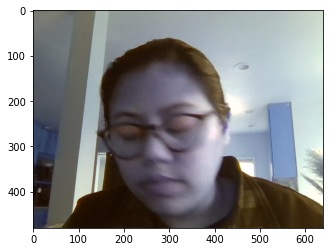

Saved: record_i_frame_101.jpg


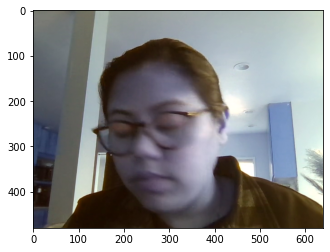

Saved: record_i_frame_103.jpg


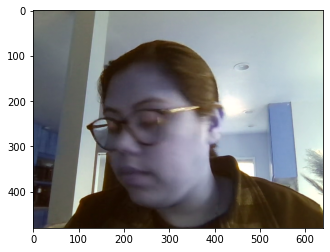

Saved: record_i_frame_104.jpg


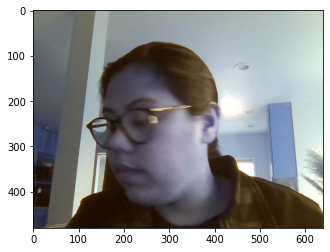

Saved: record_i_frame_105.jpg


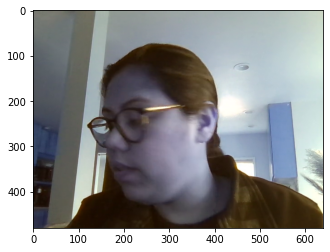

Saved: record_i_frame_107.jpg


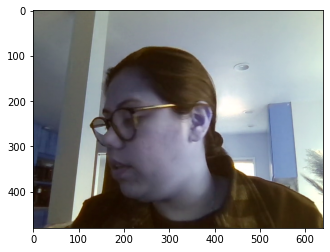

Saved: record_i_frame_108.jpg


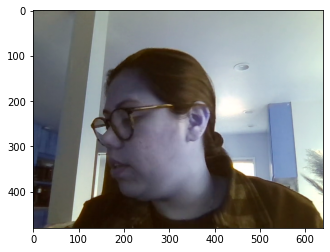

Saved: record_i_frame_109.jpg


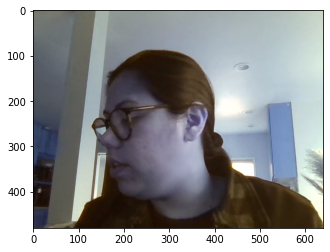

Saved: record_i_frame_111.jpg


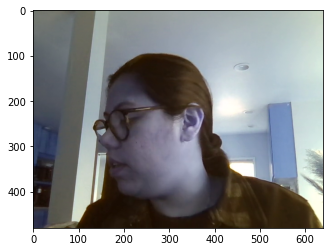

KeyboardInterrupt: ignored

In [17]:
def get_frame_types(video_fn):
    command = 'ffprobe -v error -show_entries frame=pict_type -of default=noprint_wrappers=1'.split()
    out = subprocess.check_output(command + [video_fn]).decode()
    frame_types = out.replace('pict_type=','').split()
    return zip(range(len(frame_types)), frame_types)

def save_i_keyframes(video_fn):
    frame_types = get_frame_types(video_fn)
    i_frames = [x[0] for x in frame_types if x[1]=='B']
    if i_frames[1:3]:
        basename = os.path.splitext(os.path.basename(video_fn))[0]
        cap = cv2.VideoCapture(video_fn)
        for frame_no in i_frames:
            cap.set(cv2.CAP_PROP_POS_FRAMES, frame_no)
            ret, frame = cap.read()
            outname = basename+'_i_frame_'+str(frame_no)+'.jpg'
            cv2.imwrite(outname, frame)
            print ('Saved: '+outname)
            plt.imshow(frame)
            plt.show()
        cap.release()
    else:
        print ('No I-frames in '+video_fn)

if __name__ == '__main__':
    save_i_keyframes('/content/record.mp4')